In [982]:
import torch
import numpy as np
import torch.nn as nn
import torch.nn.functional as F
import matplotlib.pyplot as plt

from torchvision import transforms, models
from PIL import Image

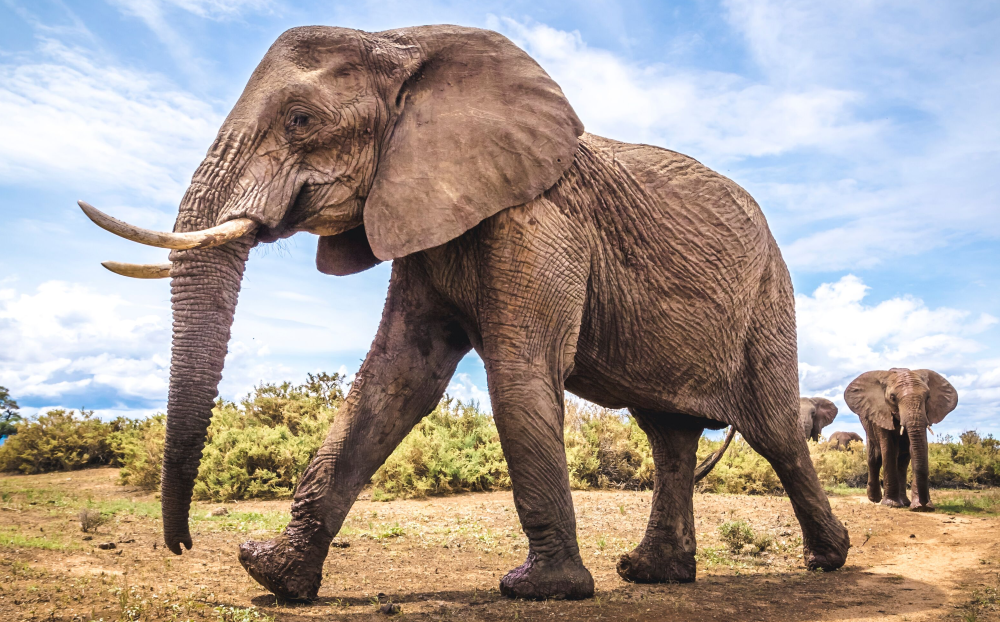

In [2]:
"""
The input image, a majestic elephant!
"""
image_ = Image.open("./elephant.png")
image_

In [3]:
mean = np.array([0.485, 0.456, 0.406])
std = np.array([0.229, 0.224, 0.225])

"""
Transforming input for forward pass.
"""

image = transforms.Resize(224)(image_)
image = transforms.CenterCrop((224, 224))(image)
image = transforms.ToTensor()(image)
image = transforms.Normalize(mean, std)(image)
image = image.reshape(1,3,224,224)

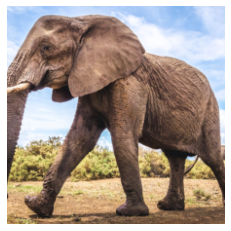

In [4]:
"""
Transform to undo the above transforms.
(Except cropping and resize)
"""
untensor = lambda tensor:np.uint8((tensor.squeeze().numpy()*std.reshape(3,1,1)+mean.reshape(3,1,1))*255).transpose(1,2,0)

plt.imshow(untensor(image))
plt.axis('off')
plt.show()

In [432]:
"""
Helper to plot a grid of images
plots all channels separately as 
greyscale.
"""
def plot_grid(img, r, c,figsize=(15,15)):
    plt.figure(figsize=figsize)
    for i, act in enumerate(img):
        plt.subplot(r,c,i+1)
        plt.imshow(act, cmap="Greys_r")
        plt.axis('off')
    plt.show()

    
"""
Scale from 0 to 255
"""
def sc255(im):
    im = im.copy()
    im -= im.min()
    im /= im.max()
    im *= 255
    im = np.uint8(im)
    return im

"""
Add a single subplot
"""
def splot(img,i=1,r=1,c=1):
    plt.subplot(r,c,i)
    plt.imshow(img, cmap="Greys_r")
    plt.axis('off')

In [6]:
"""
Get the model
pass the image through it 
check the output target.
[ImageNet Class Labels](https://gist.github.com/yrevar/942d3a0ac09ec9e5eb3a)
"""

model = models.resnet18(pretrained=True)
model.eval();
torch.set_grad_enabled(False)
class_index = model(image).squeeze().argmax().item()
print("386: 'African elephant, Loxodonta africana' :: predicted :",class_index)

# Spreading out the layers.
chl = [*model.children()]

386: 'African elephant, Loxodonta africana' :: predicted : 386


# Visualizing the activations

## First Layer
```
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
```
- Output dimensions are large enough to visualize, and a square number too, how serendipitous.
- Dimensions: (64, 112, 112)
- The batchnormed output looks the same, this maybe becuase the images aren't 0 - 255 shifted

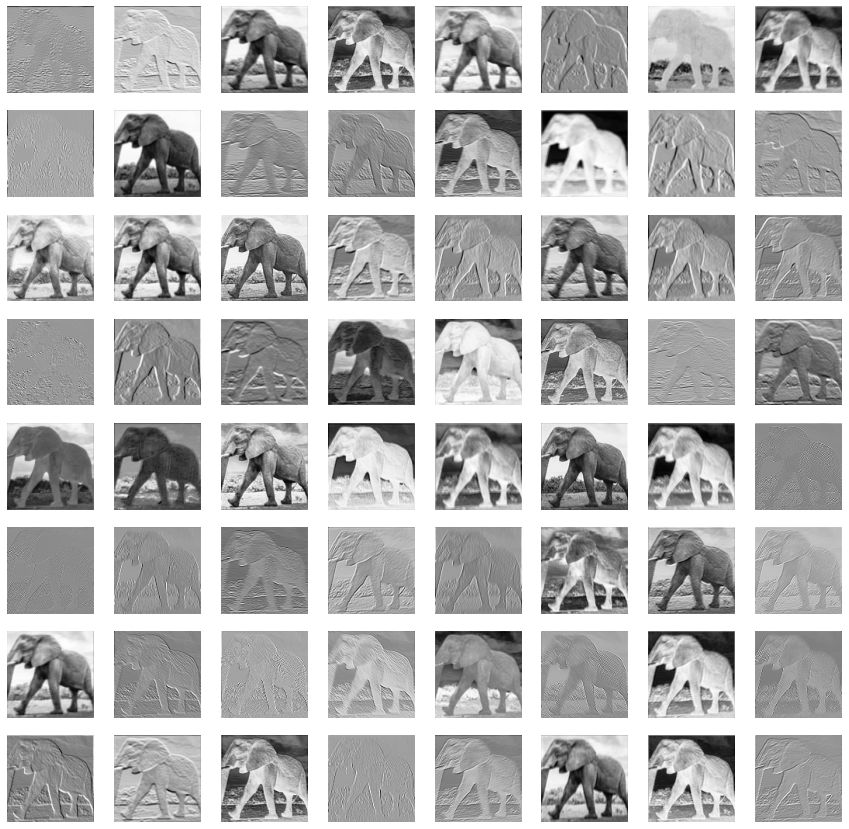

In [33]:
img1 = chl[0](image).squeeze().numpy()
plot_grid(img1,8,8)

## First conv layer with BatchNorm, ReLU and MaxPool
```
   Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
   BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
   ReLU(inplace=True)
   MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)j
```
- Dimensions (64,56,56) halved by MaxPool2d
- Due to ReLU now black images (0 values).

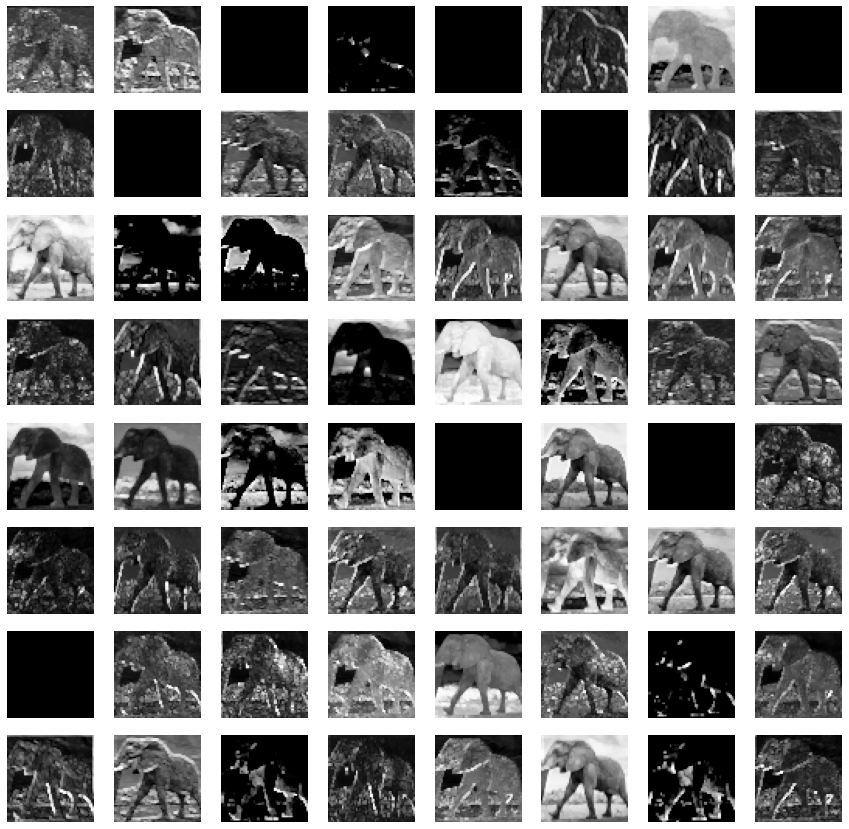

In [69]:
img1_ = torch.from_numpy(img1[np.newaxis, ...])
img2 = nn.Sequential(*chl[1:4])(img1_).squeeze().numpy()
plot_grid(img2, 8, 8)

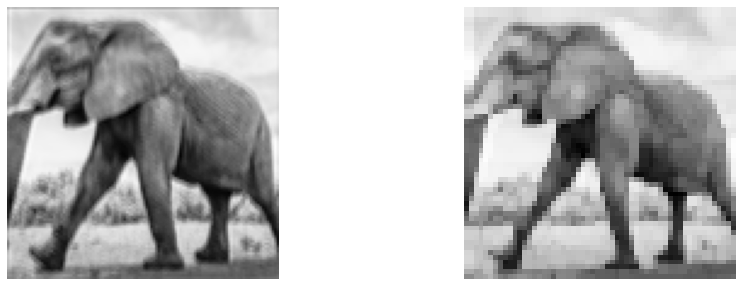

In [74]:
"""
Image with max values, after the first conv.
"""
ch_sum1 = np.abs(img1).sum(axis=(1,2))
idx_max = ch_sum1.argmax()

plt.figure(figsize=(15,5))
splot(img1[idx_max],1,1,2) # Only first
splot(img2[idx_max],2,1,2) # After MaxPool

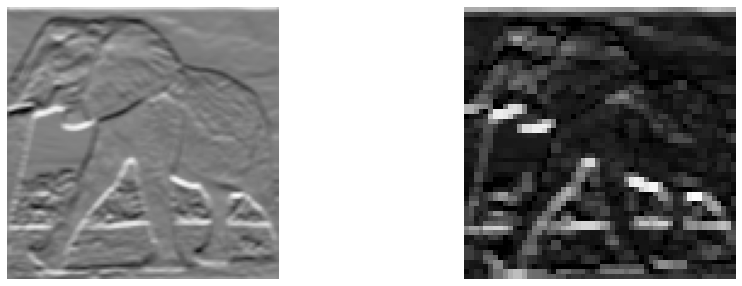

In [75]:
"""
Image with highest variance.
"""
ch_var1 = img1.var(axis=(1,2))
idx_var = ch_var1.argmax()

plt.figure(figsize=(15,5))
splot(img1[idx_var],1,1,2) # Only first
splot(img2[idx_var],2,1,2) # After MaxPool

## Remaining activations (conv layer outputs)
The outputs of conv layers get more and more abstract as one moves deeper through the 
layers. 

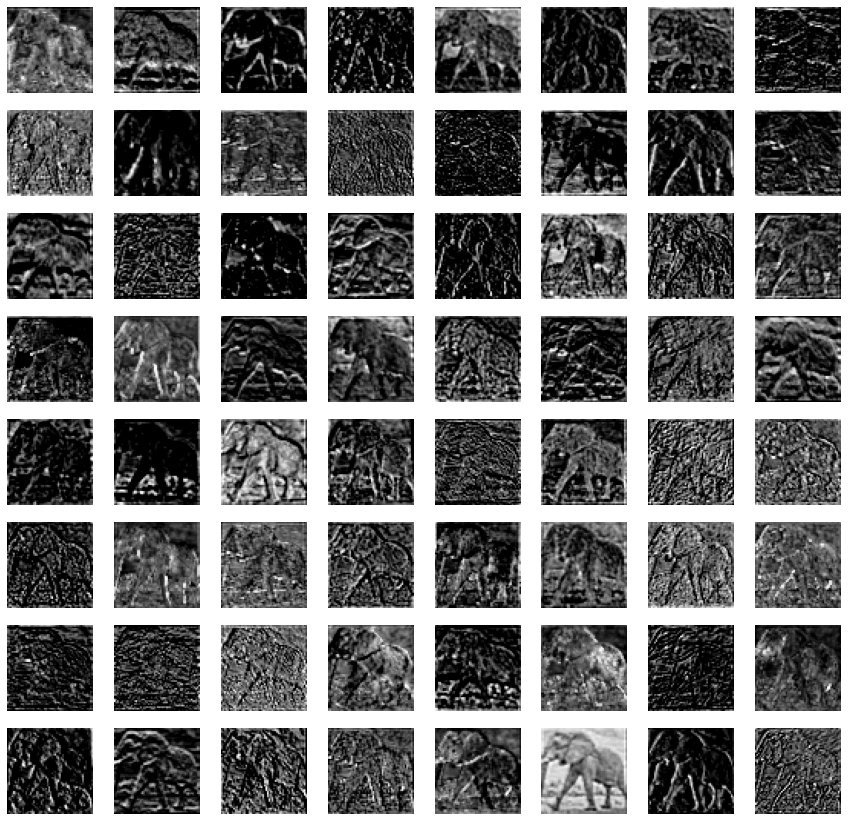

In [80]:
img2_ = torch.from_numpy(img2[np.newaxis, ...])
img3 = nn.Sequential(*chl[4:5])(img2_).squeeze().numpy() # torch.Size([64, 56, 56])
plot_grid(img3, 16, 8, figsize=(15,30))

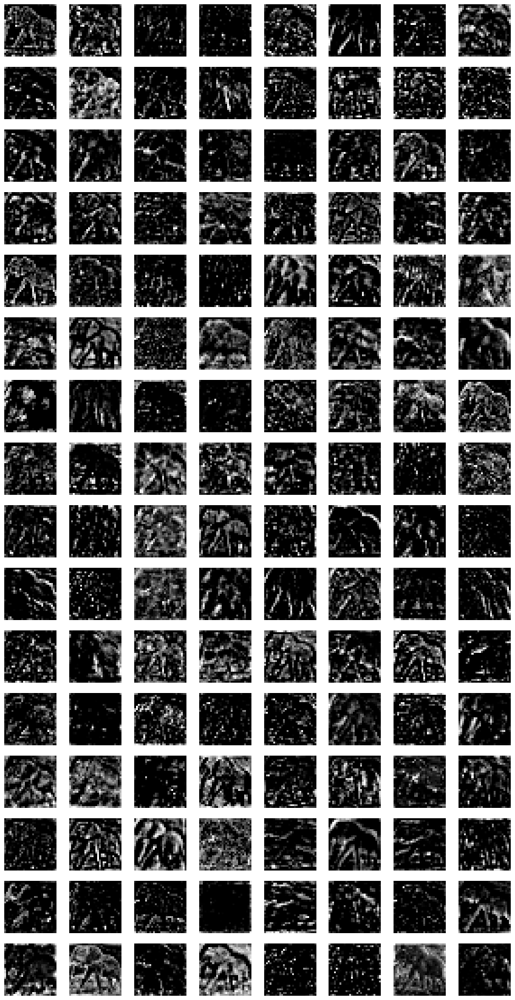

In [83]:
img3_ = torch.from_numpy(img3[np.newaxis, ...])
img4 = nn.Sequential(*chl[5:6])(img3_).squeeze().numpy() # torch.Size([128, 28, 28])
plot_grid(img4, 16, 8, figsize=(15,30))

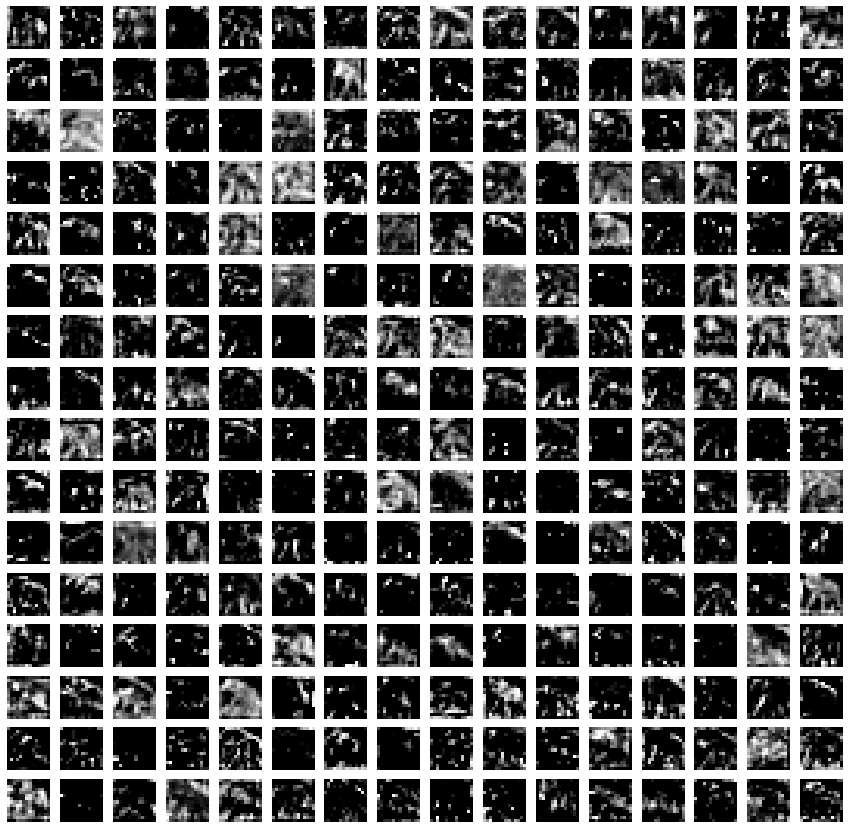

In [85]:
img4_ = torch.from_numpy(img4[np.newaxis, ...])
img5 = nn.Sequential(*chl[6:7])(img4_).squeeze().numpy() # torch.Size([256, 14, 14])
plot_grid(img5, 16, 16, figsize=(15,15))

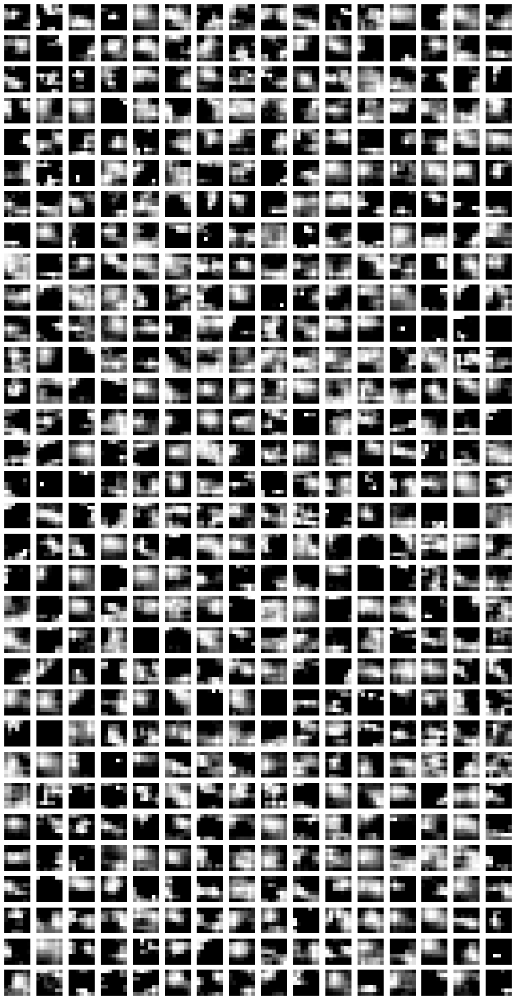

In [86]:
img5_ = torch.from_numpy(img5[np.newaxis, ...])
img6 = nn.Sequential(*chl[7:8])(img5_).squeeze().numpy() # torch.Size([512, 7, 7])
plot_grid(img6, 32, 16, figsize=(15,30))

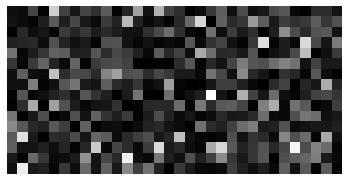

In [92]:
"""
Final 512 activations that are then converted to 1000 dim logits.
"""
img6_ = torch.from_numpy(img6[np.newaxis, ...])
img7 = nn.Sequential(*chl[8:9])(img6_).squeeze().numpy() # torch.Size([512, 7, 7])
splot(img7.reshape(-1,32),1,1,1)

386 21.078377


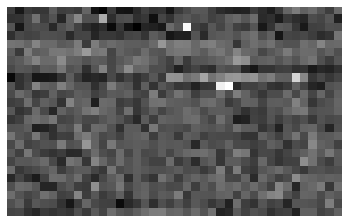

In [98]:
"""
1000 dim logits
"""
img7_ = torch.from_numpy(img7[np.newaxis, ...])
img8 = nn.Sequential(*chl[9:10])(img7_).squeeze().numpy() # torch.Size([512, 7, 7])
print(img8.argmax(), img8.max())
splot(img8.reshape(-1,40),1,1,1)

# Visualizing the filters 

In [99]:
def sc2552(im):
    im = im.copy()
    im -= im.min(axis=(1,2,3)).reshape(-1,1,1,1)
    im /= im.max(axis=(1,2,3)).reshape(-1,1,1,1)
    im *= 255
    im = np.uint8(im)
    return im

In [100]:
c1parm = [*chl[0].parameters()][0].detach().numpy()
c1parm = sc2552(c1parm)

**Conv layer 1**
Since the input has 3 channels the kernel filters can be visualized.
- One the left: $7\times 7$ Kernel Filters 
- One the right: $112\times 112$ Image Output
- Filter shape = `(64, 3, 7, 7)`
- Image shape = `(64, 112, 112)`

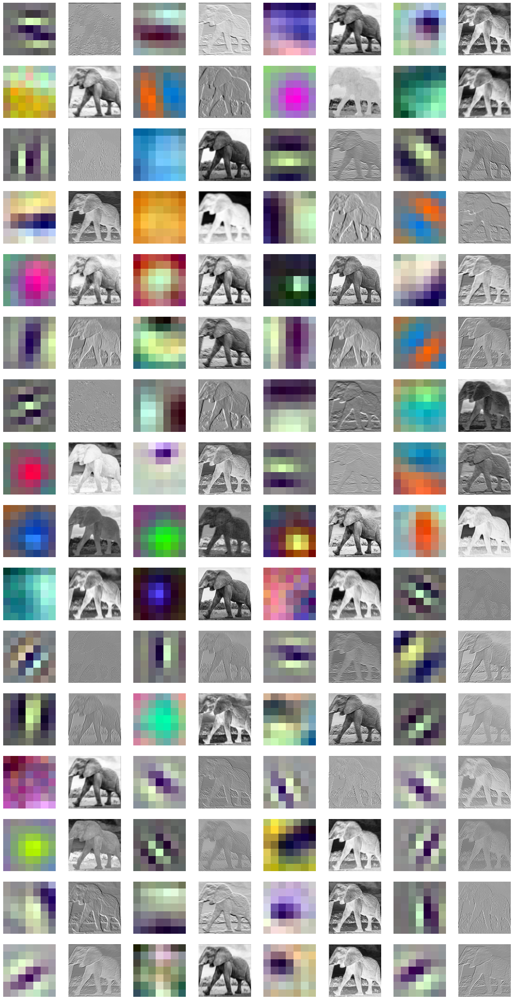

In [433]:
plt.figure(figsize=(20,40))
for j,i in enumerate(range(0,128,2)):
    plt.subplot(16,8,i+1)
    plt.imshow(c1parm[j].transpose(1,2,0))
    plt.axis('off')
    splot(img1[j],i+2,16,8)

# Visualizing patches.

Patches that cause a high activation in a certain neuron at some certain layer $l$ and some channel.

In [272]:
def get_random_idx(img, n=2, thr=0):
    """
    Function to get indices of random activations,
    above threshold.
    """
    c, h, w = np.where(img > thr)
    p = np.random.permutation(np.arange(c.size))[:n]
    i = c[p]
    j = h[p]
    k = w[p]
    return i, j, k

In [740]:
ch, hw, wi = get_random_idx(img1, 1)
kernel = torch.from_numpy(c1parm[ch]).float()

print(f"""What kind of {kernel.shape[2:]} patches
in the input image cause a high activation in the 
neuron at channel {ch[0]} and x,y at {hw[0],wi[0]}
""")

What kind of torch.Size([7, 7]) patches
in the input image cause a high activation in the 
neuron at channel 11 and x,y at (76, 27)



In [978]:
untensor_k = lambda kernel: kernel.squeeze().long().numpy().transpose(1, 2, 0)
"""
Get same padded image depending on image, kernel, stride 1
"""
def get_pad(image, kernel):
    p = int((kernel.size(-1) - 1) / 2)  # 'same' padding
    return F.pad(image, (p, ) * 4)


"""
Get n random indices of the p highest activations.
(so that the activating patches aren't close to each other)
"""
def get_idx_nmax(act, n, p=1000):
    act_ = act.numpy().copy().flatten()
    act_.sort()
    nmax = act_[-p]
    x, y = np.where(act >= nmax)
    p = np.random.permutation(np.arange(x.size))[:n]
    return x[p], y[p]


"""
Get patches of the image from given activation indices.
"""
def get_patches(img, act_idx, sz):
    patches = []
    x_, y_ = act_idx
    for i in range(x_.size):
        x = x_[i] - 3
        y = y_[i] - 3
        patches.append(img[0, :, x:(x + sz), y:(y + sz)])
    return patches


"""
Plots 42 patches
"""
def plot_patches(kernel, act, patches):
    kernel = sc255(kernel.numpy()).transpose(1, 2, 0)
    r, c = 3, 20
    fig = plt.figure(figsize=(20, 3))
    gs = GridSpec(r, c, figure=fig, wspace=0.1, hspace=0.1)

    def asp(fig, slc, img, cmap=None):
        ax = fig.add_subplot(slc)
        ax.imshow(img, cmap=cmap)
        ax.set_xticks([])
        ax.set_yticks([])
        fig.add_subplot(ax)

    asp(fig, gs[0:3, 0:3], kernel)
    asp(fig, gs[0:3, 3:6], act, cmap="Greys_r")

    patch = iter(patches)
    for i in range(r):
        for j in range(6, c):
            asp(fig, gs[i, j], untensor(next(patch)))

## Conv layer 1
- Patches that lead to high activations in the first conv layer
- Shown below, the kernel, the resulting activation, $7\times7$ patches of the input image that cause a high output from the kernel.
- 42 patches for each of the 64 kernels have been shown.
- Stride was set to 1 instead of 2 with `same` padding so the activation maps for each kernel have a dimension of $224\times 224$

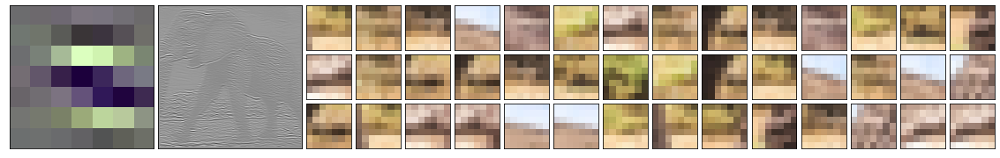

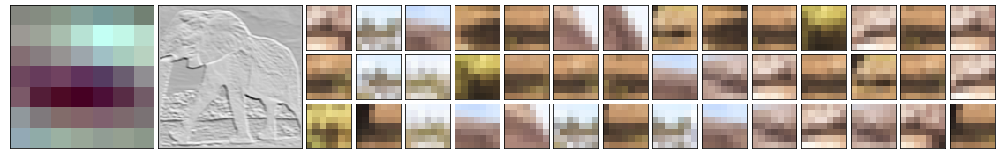

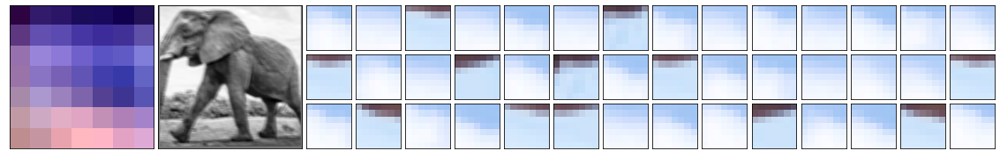

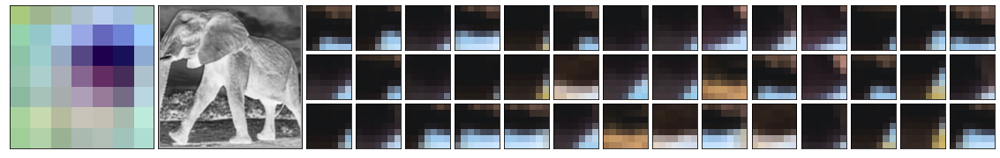

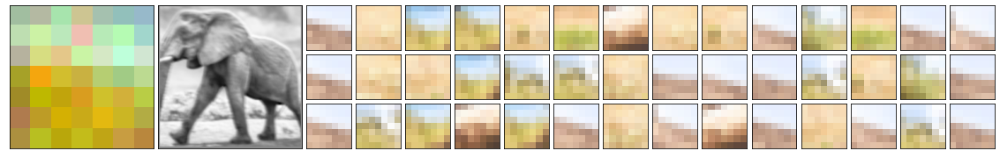

...

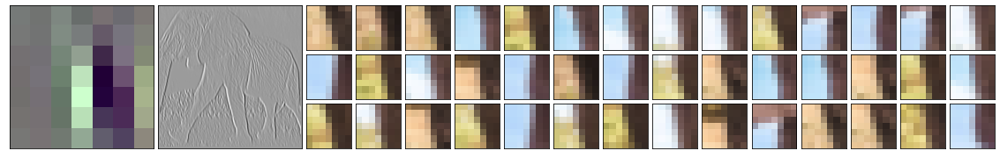

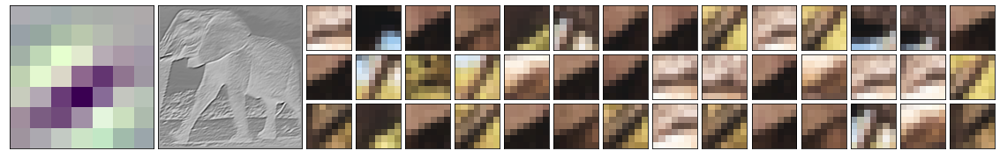

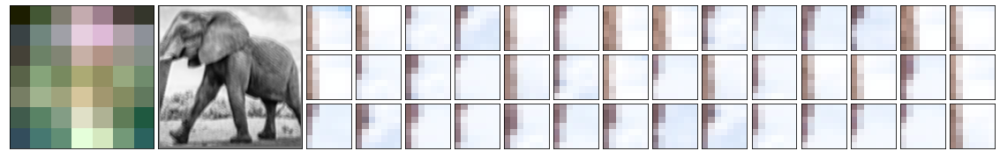

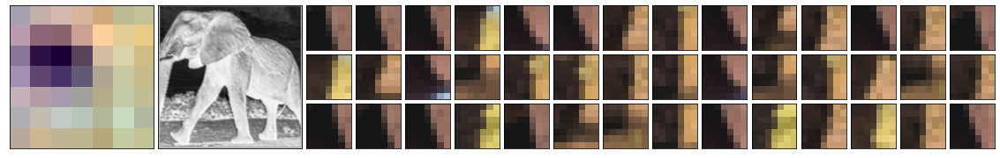

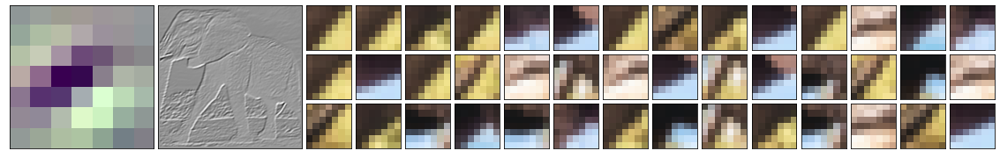

In [981]:
kernel_all = [*chl[0].parameters()][0].detach()
act_all = F.conv2d(image,kernel_all).squeeze()

for ch in range(kernel_all.size(0)):
    kernel = kernel_all[ch]
    act = act_all[ch]
    act = F.pad(act,pad=(3,3,3,3))
    act_idx = get_idx_nmax(act, 42, 42)
    patches = get_patches(image,act_idx, 7)
    plot_patches(kernel,act,patches)
    plt.show()